In [122]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from sklearn.metrics import r2_score,mean_squared_error
import seaborn as sns
import datetime
import warnings
warnings.filterwarnings("ignore")

In [77]:
data=pd.read_csv("car_price_prediction.csv")

# 1- Explore data

In [41]:
data.head(10)

,ID,Price,Levy,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,Mileage,Cylinders,Gear box type,Drive wheels,Doors,Wheel,Color,Airbags
0,45654403,13328,1399,LEXUS,RX 450,2010,Jeep,Yes,Hybrid,3.5,186005 km,6.0,Automatic,4x4,04-May,Left wheel,Silver,12
1,44731507,16621,1018,CHEVROLET,Equinox,2011,Jeep,No,Petrol,3,192000 km,6.0,Tiptronic,4x4,04-May,Left wheel,Black,8
2,45774419,8467,-,HONDA,FIT,2006,Hatchback,No,Petrol,1.3,200000 km,4.0,Variator,Front,04-May,Right-hand drive,Black,2
3,45769185,3607,862,FORD,Escape,2011,Jeep,Yes,Hybrid,2.5,168966 km,4.0,Automatic,4x4,04-May,Left wheel,White,0
4,45809263,11726,446,HONDA,FIT,2014,Hatchback,Yes,Petrol,1.3,91901 km,4.0,Automatic,Front,04-May,Left wheel,Silver,4
5,45802912,39493,891,HYUNDAI,Santa FE,2016,Jeep,Yes,Diesel,2,160931 km,4.0,Automatic,Front,04-May,Left wheel,White,4
6,45656768,1803,761,TOYOTA,Prius,2010,Hatchback,Yes,Hybrid,1.8,258909 km,4.0,Automatic,Front,04-May,Left wheel,White,12
7,45816158,549,751,HYUNDAI,Sonata,2013,Sedan,Yes,Petrol,2.4,216118 km,4.0,Automatic,Front,04-May,Left wheel,Grey,12
8,45641395,1098,394,TOYOTA,Camry,2014,Sedan,Yes,Hybrid,2.5,398069 km,4.0,Automatic,Front,04-May,Left wheel,Black,12
9,45756839,26657,-,LEXUS,RX 350,2007,Jeep,Yes,Petrol,3.5,128500 km,6.0,Automatic,4x4,04-May,Left wheel,Silver,12


In [4]:
data.shape

(19237, 18)

In [5]:
data.columns

Index(['ID', 'Price', 'Levy', 'Manufacturer', 'Model', 'Prod. year',
       'Category', 'Leather interior', 'Fuel type', 'Engine volume', 'Mileage',
       'Cylinders', 'Gear box type', 'Drive wheels', 'Doors', 'Wheel', 'Color',
       'Airbags'],
      dtype='object')

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19237 entries, 0 to 19236
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   ID                19237 non-null  int64  
 1   Price             19237 non-null  int64  
 2   Levy              19237 non-null  object 
 3   Manufacturer      19237 non-null  object 
 4   Model             19237 non-null  object 
 5   Prod. year        19237 non-null  int64  
 6   Category          19237 non-null  object 
 7   Leather interior  19237 non-null  object 
 8   Fuel type         19237 non-null  object 
 9   Engine volume     19237 non-null  object 
 10  Mileage           19237 non-null  object 
 11  Cylinders         19237 non-null  float64
 12  Gear box type     19237 non-null  object 
 13  Drive wheels      19237 non-null  object 
 14  Doors             19237 non-null  object 
 15  Wheel             19237 non-null  object 
 16  Color             19237 non-null  object

In [42]:
data.describe()

,ID,Price,Prod. year,Cylinders,Airbags
count,1.923700e+04,1.923700e+04,19237.000000,19237.000000,19237.000000
mean,4.557654e+07,1.855593e+04,2010.912824,4.582991,6.582627
std,9.365914e+05,1.905813e+05,5.668673,1.199933,4.320168
min,2.074688e+07,1.000000e+00,1939.000000,1.000000,0.000000
25%,4.569837e+07,5.331000e+03,2009.000000,4.000000,4.000000
50%,4.577231e+07,1.317200e+04,2012.000000,4.000000,6.000000
75%,4.580204e+07,2.207500e+04,2015.000000,4.000000,12.000000
max,4.581665e+07,2.630750e+07,2020.000000,16.000000,16.000000


In [78]:
data.duplicated().sum()

313

In [79]:
data.drop_duplicates(inplace=True)

In [45]:
data.shape

(18924, 18)

In [46]:
data.isnull().sum()

ID                  0
Price               0
Levy                0
Manufacturer        0
Model               0
Prod. year          0
Category            0
Leather interior    0
Fuel type           0
Engine volume       0
Mileage             0
Cylinders           0
Gear box type       0
Drive wheels        0
Doors               0
Wheel               0
Color               0
Airbags             0
dtype: int64

# 2- Analysis

In [47]:
data.Manufacturer.unique()

array(['LEXUS', 'CHEVROLET', 'HONDA', 'FORD', 'HYUNDAI', 'TOYOTA',
       'MERCEDES-BENZ', 'OPEL', 'PORSCHE', 'BMW', 'JEEP', 'VOLKSWAGEN',
       'AUDI', 'RENAULT', 'NISSAN', 'SUBARU', 'DAEWOO', 'KIA',
       'MITSUBISHI', 'SSANGYONG', 'MAZDA', 'GMC', 'FIAT', 'INFINITI',
       'ALFA ROMEO', 'SUZUKI', 'ACURA', 'LINCOLN', 'VAZ', 'GAZ',
       'CITROEN', 'LAND ROVER', 'MINI', 'DODGE', 'CHRYSLER', 'JAGUAR',
       'ISUZU', 'SKODA', 'DAIHATSU', 'BUICK', 'TESLA', 'CADILLAC',
       'PEUGEOT', 'BENTLEY', 'VOLVO', 'სხვა', 'HAVAL', 'HUMMER', 'SCION',
       'UAZ', 'MERCURY', 'ZAZ', 'ROVER', 'SEAT', 'LANCIA', 'MOSKVICH',
       'MASERATI', 'FERRARI', 'SAAB', 'LAMBORGHINI', 'ROLLS-ROYCE',
       'PONTIAC', 'SATURN', 'ASTON MARTIN', 'GREATWALL'], dtype=object)

In [48]:
for col in data.columns:
    print(col," : " ,data[col].nunique())

ID  :  18924
Price  :  2315
Levy  :  559
Manufacturer  :  65
Model  :  1590
Prod. year  :  54
Category  :  11
Leather interior  :  2
Fuel type  :  7
Engine volume  :  107
Mileage  :  7687
Cylinders  :  13
Gear box type  :  4
Drive wheels  :  3
Doors  :  3
Wheel  :  2
Color  :  16
Airbags  :  17


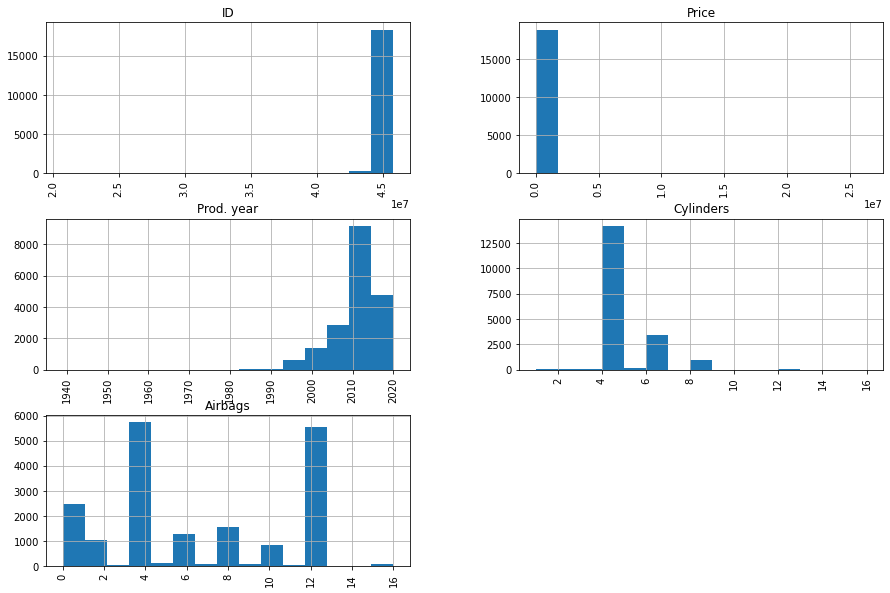

In [49]:
data.hist(bins=15,xrot=90, figsize=(15,10)) 
plt.show()

In [50]:
data.Manufacturer.value_counts().sort_values(ascending=False)

HYUNDAI          3729
TOYOTA           3606
MERCEDES-BENZ    2043
FORD             1088
CHEVROLET        1047
BMW              1036
HONDA             960
LEXUS             927
NISSAN            645
VOLKSWAGEN        571
SSANGYONG         439
KIA               417
OPEL              396
MITSUBISHI        288
SUBARU            274
AUDI              254
MAZDA             175
JEEP              138
DAEWOO             91
DODGE              90
SUZUKI             76
FIAT               76
PORSCHE            52
LAND ROVER         48
VAZ                47
MINI               47
JAGUAR             42
RENAULT            36
INFINITI           26
CHRYSLER           26
SKODA              20
VOLVO              19
PEUGEOT            17
BUICK              16
LINCOLN            15
ACURA              15
GMC                15
CADILLAC           14
DAIHATSU           13
GAZ                12
UAZ                12
CITROEN             9
SCION               7
HUMMER              5
MASERATI            4
MERCURY   

In [16]:
top10cars=data.Manufacturer.value_counts().sort_values(ascending=False)[:10]
top10cars

HYUNDAI          3729
TOYOTA           3606
MERCEDES-BENZ    2043
FORD             1088
CHEVROLET        1047
BMW              1036
HONDA             960
LEXUS             927
NISSAN            645
VOLKSWAGEN        571
Name: Manufacturer, dtype: int64

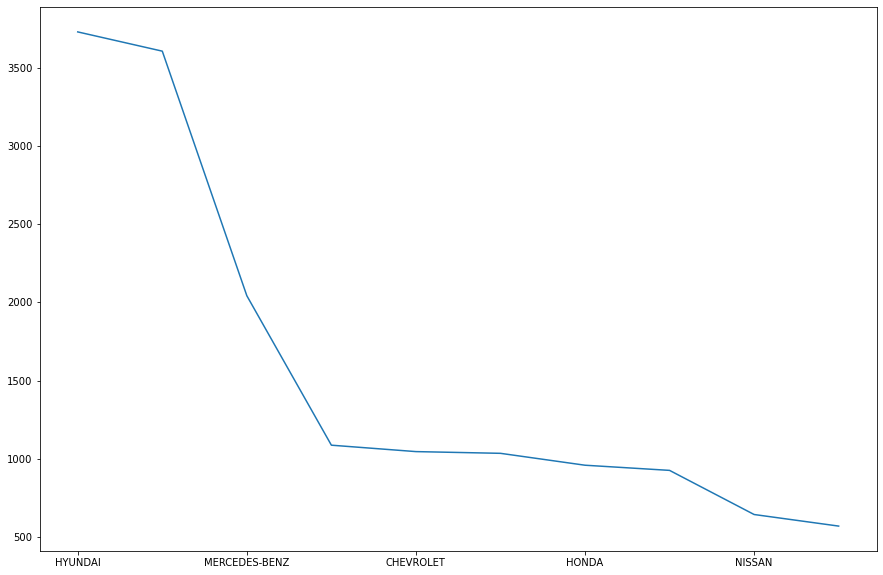

In [17]:
top10cars.plot(figsize=(15,10))
plt.show()

In [18]:
top10meanPrice=[data[data["Manufacturer"]==i]["Price"].mean() for i in list(top10cars.index)]
top10meanPrice

[22306.00080450523,
 14302.447864669994,
 18590.331375428294,
 15411.85018382353,
 14894.873925501433,
 20609.468146718147,
 14162.073958333332,
 20052.594390507013,
 9835.84031007752,
 11471.77408056042]

In [51]:
pd.pivot_table(data,index="Manufacturer",values="Price").sort_values("Price")[:10]

,Price
Manufacturer,
ROLLS-ROYCE,178.500000
ROVER,2433.333333
ZAZ,3822.500000
MOSKVICH,4609.000000
VAZ,4659.893617
SEAT,4829.500000
UAZ,5290.750000
DAIHATSU,5402.769231
ACURA,5910.933333


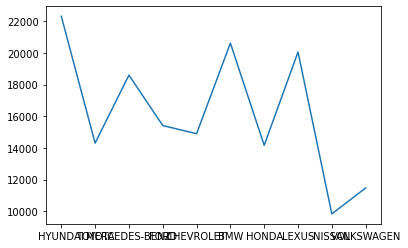

In [52]:
plt.plot(top10cars.index,top10meanPrice)


In [53]:
cor=data.corr()
cor

,ID,Price,Prod. year,Cylinders,Airbags
ID,1.000000,-0.000797,0.072030,-0.040617,-0.022070
Price,-0.000797,1.000000,0.012689,0.007435,-0.012709
Prod. year,0.072030,0.012689,1.000000,-0.099443,0.235160
Cylinders,-0.040617,0.007435,-0.099443,1.000000,0.174112
Airbags,-0.022070,-0.012709,0.235160,0.174112,1.000000


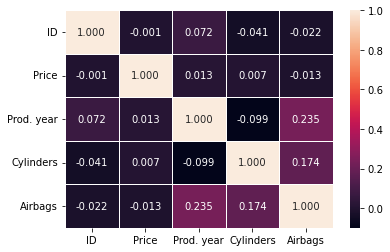

In [54]:
sns.heatmap(cor,linewidths='0.7',annot=True,fmt='.3f')
plt.show()

In [55]:
data_obj=data.select_dtypes(include='object')
data_obj

,Levy,Manufacturer,Model,Category,Leather interior,Fuel type,Engine volume,Mileage,Gear box type,Drive wheels,Doors,Wheel,Color
0,1399,LEXUS,RX 450,Jeep,Yes,Hybrid,3.5,186005 km,Automatic,4x4,04-May,Left wheel,Silver
1,1018,CHEVROLET,Equinox,Jeep,No,Petrol,3,192000 km,Tiptronic,4x4,04-May,Left wheel,Black
2,-,HONDA,FIT,Hatchback,No,Petrol,1.3,200000 km,Variator,Front,04-May,Right-hand drive,Black
3,862,FORD,Escape,Jeep,Yes,Hybrid,2.5,168966 km,Automatic,4x4,04-May,Left wheel,White
4,446,HONDA,FIT,Hatchback,Yes,Petrol,1.3,91901 km,Automatic,Front,04-May,Left wheel,Silver
5,891,HYUNDAI,Santa FE,Jeep,Yes,Diesel,2,160931 km,Automatic,Front,04-May,Left wheel,White
6,761,TOYOTA,Prius,Hatchback,Yes,Hybrid,1.8,258909 km,Automatic,Front,04-May,Left wheel,White
7,751,HYUNDAI,Sonata,Sedan,Yes,Petrol,2.4,216118 km,Automatic,Front,04-May,Left wheel,Grey
8,394,TOYOTA,Camry,Sedan,Yes,Hybrid,2.5,398069 km,Automatic,Front,04-May,Left wheel,Black
9,-,LEXUS,RX 350,Jeep,Yes,Petrol,3.5,128500 km,Automatic,4x4,04-May,Left wheel,Silver


In [56]:
data_obj.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18924 entries, 0 to 19236
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Levy              18924 non-null  object
 1   Manufacturer      18924 non-null  object
 2   Model             18924 non-null  object
 3   Category          18924 non-null  object
 4   Leather interior  18924 non-null  object
 5   Fuel type         18924 non-null  object
 6   Engine volume     18924 non-null  object
 7   Mileage           18924 non-null  object
 8   Gear box type     18924 non-null  object
 9   Drive wheels      18924 non-null  object
 10  Doors             18924 non-null  object
 11  Wheel             18924 non-null  object
 12  Color             18924 non-null  object
dtypes: object(13)
memory usage: 2.0+ MB


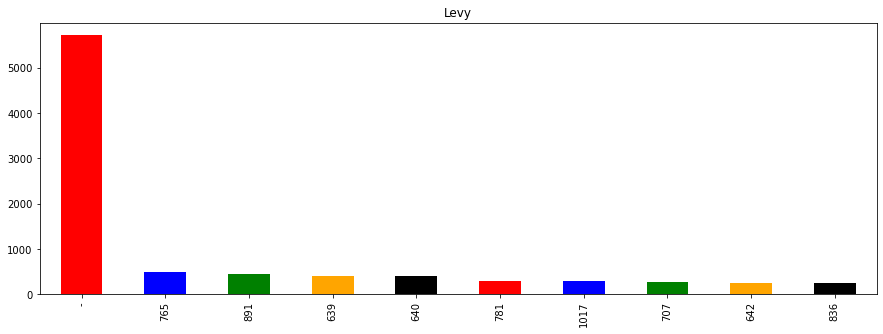

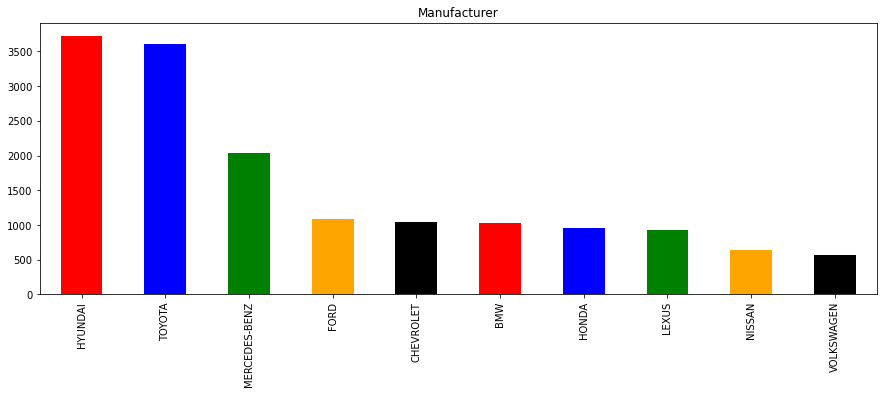

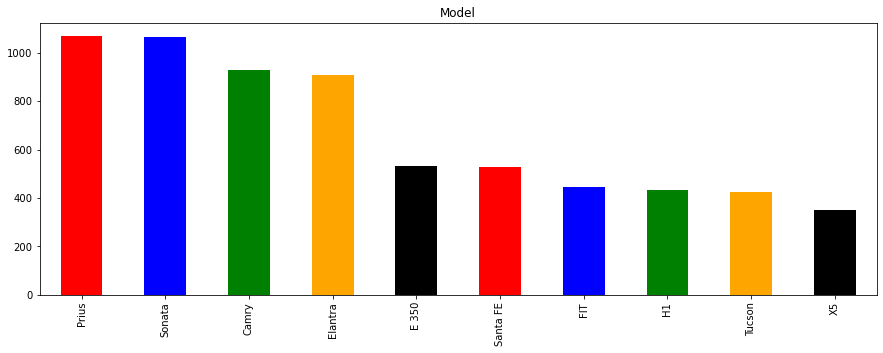

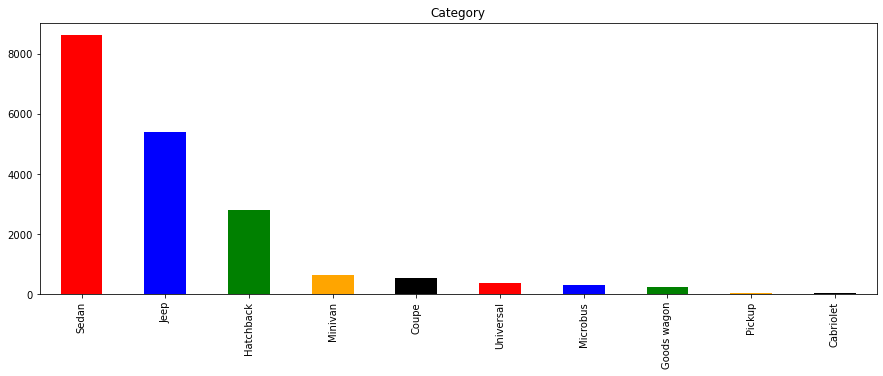

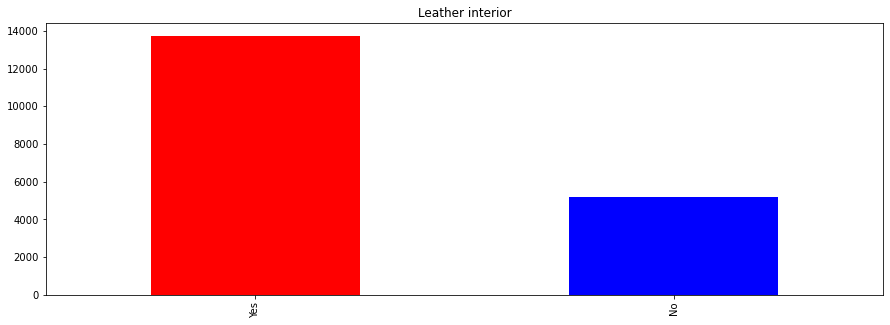

...

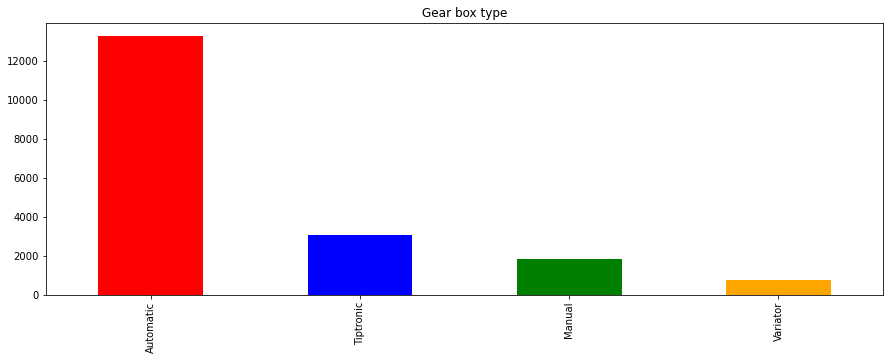

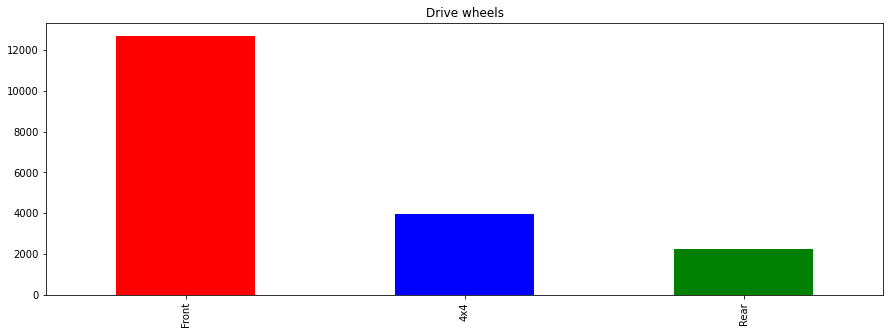

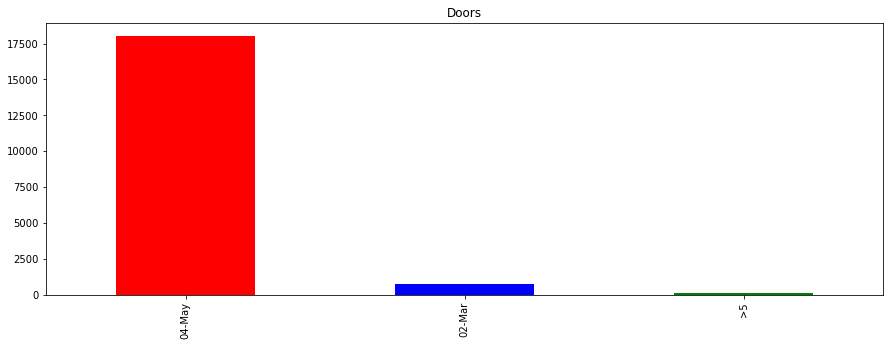

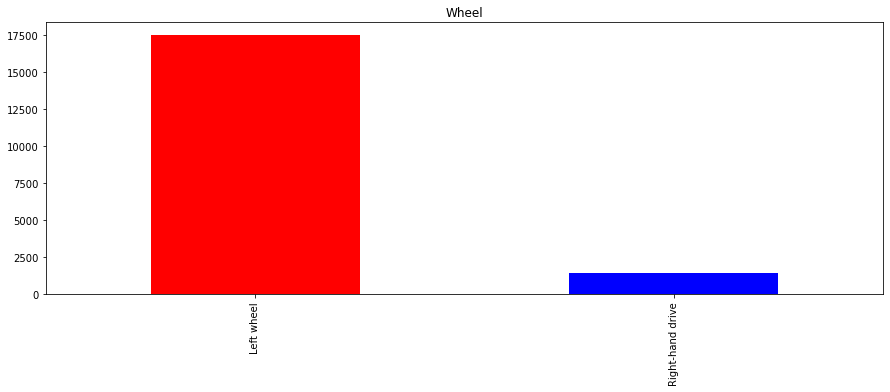

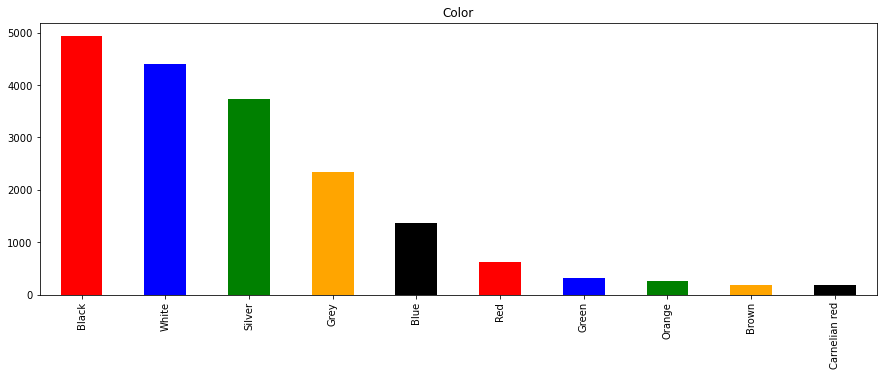

In [57]:
for col in data_obj:
    plt.figure(figsize=(15,5))
    top10=data[col].value_counts()[:10]
    colors=["red","blue","green","orange","black"]
    top10.plot(kind='bar',color=colors)
    plt.title(col)
    plt.show()

# 3- Data Procesing

In [39]:
pd.set_option("max_rows", None)

data.head(10)

,Price,Levy,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,Mileage,Cylinders,Gear box type,Drive wheels,Wheel,Color,Airbags,Age
0,13328,None,LEXUS,RX 450,2010,Jeep,Yes,Hybrid,3.5,186005 km,6.0,Automatic,4x4,Left wheel,Silver,12,13
1,16621,None,CHEVROLET,Equinox,2011,Jeep,No,Petrol,3,192000 km,6.0,Tiptronic,4x4,Left wheel,Black,8,12
2,8467,None,HONDA,FIT,2006,Hatchback,No,Petrol,1.3,200000 km,4.0,Variator,Front,Right-hand drive,Black,2,17
3,3607,None,FORD,Escape,2011,Jeep,Yes,Hybrid,2.5,168966 km,4.0,Automatic,4x4,Left wheel,White,0,12
4,11726,None,HONDA,FIT,2014,Hatchback,Yes,Petrol,1.3,91901 km,4.0,Automatic,Front,Left wheel,Silver,4,9
5,39493,None,HYUNDAI,Santa FE,2016,Jeep,Yes,Diesel,2,160931 km,4.0,Automatic,Front,Left wheel,White,4,7
6,1803,None,TOYOTA,Prius,2010,Hatchback,Yes,Hybrid,1.8,258909 km,4.0,Automatic,Front,Left wheel,White,12,13
7,549,None,HYUNDAI,Sonata,2013,Sedan,Yes,Petrol,2.4,216118 km,4.0,Automatic,Front,Left wheel,Grey,12,10
8,1098,None,TOYOTA,Camry,2014,Sedan,Yes,Hybrid,2.5,398069 km,4.0,Automatic,Front,Left wheel,Black,12,9
9,26657,None,LEXUS,RX 350,2007,Jeep,Yes,Petrol,3.5,128500 km,6.0,Automatic,4x4,Left wheel,Silver,12,16


In [80]:
data=data.drop(['ID','Doors'],axis=1)

In [81]:
data.columns

Index(['Price', 'Levy', 'Manufacturer', 'Model', 'Prod. year', 'Category',
       'Leather interior', 'Fuel type', 'Engine volume', 'Mileage',
       'Cylinders', 'Gear box type', 'Drive wheels', 'Wheel', 'Color',
       'Airbags'],
      dtype='object')

In [82]:
 date=datetime.datetime.now()

In [83]:
data['Age']=date.year-data["Prod. year"]

In [84]:
data["Levy"]=data["Levy"].apply(lambda x: '0' if x=='-' else x)

In [64]:
data.Levy.value_counts()

0        5709
765       482
891       453
639       403
640       398
781       294
1017      291
707       268
642       259
836       259
779       249
777       240
585       213
831       206
586       188
1172      186
761       182
1399      176
1091      168
730       167
645       157
394       156
531       156
1058      149
919       141
583       136
1018      133
753       128
862       127
1053      126
584       125
1079      119
530       115
934       108
503       107
1249      106
308       101
528       101
687       101
382        99
629        97
697        96
751        95
1055       93
1077       92
915        92
1024       90
502        83
1750       78
1811       75
900        74
1646       72
790        69
1327       66
1363       66
749        64
690        63
843        63
917        61
1273       58
475        58
333        55
1185       54
810        54
353        53
880        53
609        52
1104       51
1268       49
1850       47
259        47
1624  

In [85]:
data["Levy"]=data["Levy"].astype(int)
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18924 entries, 0 to 19236
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Price             18924 non-null  int64  
 1   Levy              18924 non-null  int32  
 2   Manufacturer      18924 non-null  object 
 3   Model             18924 non-null  object 
 4   Prod. year        18924 non-null  int64  
 5   Category          18924 non-null  object 
 6   Leather interior  18924 non-null  object 
 7   Fuel type         18924 non-null  object 
 8   Engine volume     18924 non-null  object 
 9   Mileage           18924 non-null  object 
 10  Cylinders         18924 non-null  float64
 11  Gear box type     18924 non-null  object 
 12  Drive wheels      18924 non-null  object 
 13  Wheel             18924 non-null  object 
 14  Color             18924 non-null  object 
 15  Airbags           18924 non-null  int64  
 16  Age               18924 non-null  int64 

In [86]:
data["Mileage"]=data["Mileage"].str.replace('km','')

In [87]:
data.head(5)

,Price,Levy,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,Mileage,Cylinders,Gear box type,Drive wheels,Wheel,Color,Airbags,Age
0,13328,1399,LEXUS,RX 450,2010,Jeep,Yes,Hybrid,3.5,186005,6.0,Automatic,4x4,Left wheel,Silver,12,13
1,16621,1018,CHEVROLET,Equinox,2011,Jeep,No,Petrol,3,192000,6.0,Tiptronic,4x4,Left wheel,Black,8,12
2,8467,0,HONDA,FIT,2006,Hatchback,No,Petrol,1.3,200000,4.0,Variator,Front,Right-hand drive,Black,2,17
3,3607,862,FORD,Escape,2011,Jeep,Yes,Hybrid,2.5,168966,4.0,Automatic,4x4,Left wheel,White,0,12
4,11726,446,HONDA,FIT,2014,Hatchback,Yes,Petrol,1.3,91901,4.0,Automatic,Front,Left wheel,Silver,4,9


In [88]:
data["Engine volume"]=data["Engine volume"].str.replace('Turbo',"")
data["Engine volume"]=data["Engine volume"].astype(float)

In [89]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18924 entries, 0 to 19236
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Price             18924 non-null  int64  
 1   Levy              18924 non-null  int32  
 2   Manufacturer      18924 non-null  object 
 3   Model             18924 non-null  object 
 4   Prod. year        18924 non-null  int64  
 5   Category          18924 non-null  object 
 6   Leather interior  18924 non-null  object 
 7   Fuel type         18924 non-null  object 
 8   Engine volume     18924 non-null  float64
 9   Mileage           18924 non-null  object 
 10  Cylinders         18924 non-null  float64
 11  Gear box type     18924 non-null  object 
 12  Drive wheels      18924 non-null  object 
 13  Wheel             18924 non-null  object 
 14  Color             18924 non-null  object 
 15  Airbags           18924 non-null  int64  
 16  Age               18924 non-null  int64 

# Delete outlier

In [90]:
data_num=data.select_dtypes(exclude="object")
for col in data_num:
    q1= data[col].quantile(0.25)
    q3= data[col].quantile(0.75)
    iqr=q3-q1
    low=q1-1.5*iqr
    high=q3+1.5*iqr
    outlier=((data[col]>high)|(data[col]<low)).sum()
    total=data_num.shape[0]
    print(f"Total outlier in {col} are : {outlier}===>{round(100*(outlier)/total,2)}%")
    if outlier>0:
        data=data.loc[(data[col]<=high)&(data[col]>=low)]

Total outlier in Price are : 1055===>5.57%
Total outlier in Levy are : 161===>0.85%
Total outlier in Prod. year are : 1468===>7.76%
Total outlier in Engine volume are : 951===>5.03%
Total outlier in Cylinders are : 2871===>15.17%
Total outlier in Airbags are : 0===>0.0%
Total outlier in Age are : 178===>0.94%


# Transform Data

In [92]:
dobject=data.select_dtypes(include='object')
dnum=data.select_dtypes(exclude='object')
LaEn=LabelEncoder()

In [93]:
for i in range(0,dobject.shape[1]):
    dobject.iloc[:,i]=LaEn.fit_transform(dobject.iloc[:,i])

In [95]:
data=pd.concat([dobject,dnum],axis=1)

In [96]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12240 entries, 2 to 19236
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Manufacturer      12240 non-null  int32  
 1   Model             12240 non-null  int32  
 2   Category          12240 non-null  int32  
 3   Leather interior  12240 non-null  int32  
 4   Fuel type         12240 non-null  int32  
 5   Mileage           12240 non-null  int32  
 6   Gear box type     12240 non-null  int32  
 7   Drive wheels      12240 non-null  int32  
 8   Wheel             12240 non-null  int32  
 9   Color             12240 non-null  int32  
 10  Price             12240 non-null  int64  
 11  Levy              12240 non-null  int32  
 12  Prod. year        12240 non-null  int64  
 13  Engine volume     12240 non-null  float64
 14  Cylinders         12240 non-null  float64
 15  Airbags           12240 non-null  int64  
 16  Age               12240 non-null  int64 

# 4- Model

In [147]:
X=data.drop('Price',axis=1)
Y=data['Price']

In [192]:
x_train,x_test, y_train,y_test=train_test_split(X,Y,test_size=0.2,random_state=42)

In [193]:
Algos=['LinearRegression','DecisionTreeRegressor','RandomForestRegressor','GradientBoostingRegressor','SVR','XGBRegressor']
R2=[]
RMSE=[]

In [194]:
def models(model,i):
    model.fit(x_train,y_train)
    pre=model.predict(x_test)
    r2=r2_score(y_test,pre)
    R2.append(r2)
    rmse=np.sqrt(mean_squared_error(y_test,pre))
    RMSE.append(rmse)
    score=model.score(x_test,y_test)
    print(f"The Score of Model {Algos[i]} is : {score}")  

In [195]:
model=[LinearRegression(),DecisionTreeRegressor(),RandomForestRegressor(),GradientBoostingRegressor(),SVR(),XGBRegressor()]

In [196]:
for mod in model:
    models(mod,model.index(mod))

The Score of Model LinearRegression is : 0.20929777978571074
The Score of Model DecisionTreeRegressor is : 0.6216219712200621
The Score of Model RandomForestRegressor is : 0.7722449086160164
The Score of Model GradientBoostingRegressor is : 0.6634844835665903
The Score of Model SVR is : -0.003901239567274617
The Score of Model XGBRegressor is : 0.7597423765097001


In [197]:
df=pd.DataFrame({'Algorithm':Algos,'R2_Score':R2,'RMSE':RMSE})
df

,Algorithm,R2_Score,RMSE
0,LinearRegression,0.209298,9896.477993
1,DecisionTreeRegressor,0.621622,6846.003854
2,RandomForestRegressor,0.772245,5311.390485
3,GradientBoostingRegressor,0.663484,6456.196367
4,SVR,-0.003901,11151.150554
5,XGBRegressor,0.759742,5455.226317


In [160]:
models(DecisionTreeRegressor(),1)

The Score of Model DecisionTreeRegressor is : 0.6297542060527468


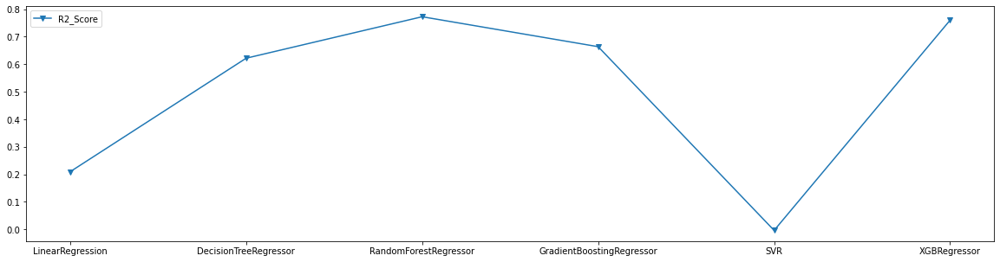

In [202]:
fig, sx=plt.subplots(figsize=(20,5))
plt.plot(df.Algorithm, df.R2_Score,label='R2_Score',marker="o")
plt.legend()
plt.show()

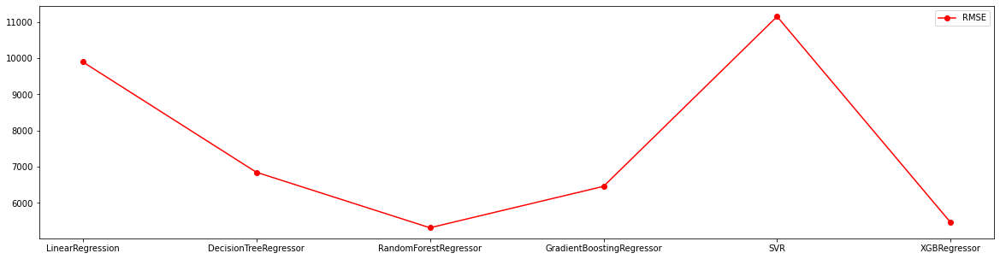

In [203]:
fig, sx=plt.subplots(figsize=(20,5))
plt.plot(df.Algorithm, df.RMSE,label='RMSE',c='r',marker="o")
plt.legend()
plt.show()

In [204]:
import pickle

In [205]:
file_name='Cars_Predictions.sav'

In [206]:
pickle.dump(model[2],open(file_name,'wb'))